Copyright © 2021, SAS Institute Inc., Cary, NC, USA.  All Rights Reserved.
SPDX-License-Identifier: Apache-2.0

## Using `Community` Actions in the `NETWORK` Actionset to Partition the Airports Worldwide into Communities 

------------------------------------------------------------------------------------------------------------------------------

In this Jupyter notebook, we partition the airports using the `Community` action based on the existing flight routes between them. Airports within one partition will be more densely connected than airports across partitions. Our graph consists of all airports worldwide and the existing air routes between them. We obtain the airlines, airports, routes, and planes datasets from the "openflights.org" website. The code for reading the data as well as the data preparation and cleaning steps, are stored in the "helper.py" script. 

To read more about the `Community` action, refer to [SAS Documentation]( https://pubshelpcenter.unx.sas.com/test/doc/en/pgmsascdc/default/casactml/cas-network-community.htm).  


------------------------------------------------------------------------------------------------------------------------------
The flow of this notebook is as follows:
* [Reading the airports, airlines, and routes data from openflights website](#1st-bullet)
* [Connecting to CAS server](#2nd-bullet)
* [Uploading links (routes) DataFrame to CAS](#3rd-bullet)
* [Partitions all airports into communities](#4th-bullet)
* [Visualizing the communities with different resolutions](#5th-bullet)
* [Partitions US airports into communities](#6th-bullet)
* [Visualizing the communities with different resolutions](#7th-bullet)

------------------------------------------------------------------------------------------------------------------------------
**Prepared by:** Hossein Tohidi (<i class="fa fa-github" aria-hidden="true"></i> [Hossein-Tohidi](https://github.com/Hossein-Tohidi))

In [1]:
import swat
import pandas as pd
import matplotlib.pyplot as plt
import sys
import os
sys.path.append(os.path.join(os.path.dirname(os.getcwd()),r"../../common/python"))
import cas_connection as cas 
import geopandas as gpd
from matplotlib import cm
import matplotlib as mpl
from shapely.geometry import Polygon
import helper
import warnings
warnings.filterwarnings("ignore", category=FutureWarning) 

### Reading the airports, airlines, and routes data from openflights website <a class="anchor" id="1st-bullet"></a>

In [2]:
airports = helper.read_airports("https://raw.githubusercontent.com/jpatokal/openflights/master/data/airports.dat")
airports.head()

,AirportID,Name,City,Country,IATA,ICAO,Latitude,Longitude,Altitude,Timezone,DST,Tz,Type,Source,node,pos
0,1,Goroka Airport,Goroka,Papua New Guinea,GKA,AYGA,-6.081690,145.391998,5282,10,U,Pacific/Port_Moresby,airport,OurAirports,GKA,"(145.391998291, -6.081689834590001)"
1,2,Madang Airport,Madang,Papua New Guinea,MAG,AYMD,-5.207080,145.789001,20,10,U,Pacific/Port_Moresby,airport,OurAirports,MAG,"(145.789001465, -5.20707988739)"
2,3,Mount Hagen Kagamuga Airport,Mount Hagen,Papua New Guinea,HGU,AYMH,-5.826790,144.296005,5388,10,U,Pacific/Port_Moresby,airport,OurAirports,HGU,"(144.29600524902344, -5.826789855957031)"
3,4,Nadzab Airport,Nadzab,Papua New Guinea,LAE,AYNZ,-6.569803,146.725977,239,10,U,Pacific/Port_Moresby,airport,OurAirports,LAE,"(146.725977, -6.569803)"
4,5,Port Moresby Jacksons International Airport,Port Moresby,Papua New Guinea,POM,AYPY,-9.443380,147.220001,146,10,U,Pacific/Port_Moresby,airport,OurAirports,POM,"(147.22000122070312, -9.44338035583496)"


In [3]:
airlines = helper.read_airlines("https://raw.githubusercontent.com/jpatokal/openflights/master/data/airlines.dat")
airlines.head()

,Airline ID,Airline Name,Alias,Airline IATA,ICAO,Callsign,Airline Country,Active
1,1,Private flight,\N,-,NaN,NaN,NaN,Y
3,3,1Time Airline,\N,1T,RNX,NEXTIME,South Africa,Y
10,10,40-Mile Air,\N,Q5,MLA,MILE-AIR,United States,Y
13,13,Ansett Australia,\N,AN,AAA,ANSETT,Australia,Y
14,14,Abacus International,\N,1B,NaN,NaN,Singapore,Y


In [4]:
routes = helper.read_routes("https://raw.githubusercontent.com/jpatokal/openflights/master/data/routes.dat",airports,airlines)
routes.head()

,from,Source airport ID,to,Destination airport ID,Codeshare,Equipment,Airline IATA,Airline Name,Airline Country
0,AER,2965,KZN,2990,NaN,CR2,2B,Aerocondor,Portugal
1,ASF,2966,KZN,2990,NaN,CR2,2B,Aerocondor,Portugal
2,ASF,2966,MRV,2962,NaN,CR2,2B,Aerocondor,Portugal
3,CEK,2968,KZN,2990,NaN,CR2,2B,Aerocondor,Portugal
4,CEK,2968,OVB,4078,NaN,CR2,2B,Aerocondor,Portugal


### Connecting to CAS server  <a class="anchor" id="2nd-bullet"></a>

In [5]:
s = cas.reconnect()
s.loadActionSet('network')

NOTE: Added action set 'network'.


[actionset]

 'network'

+ Elapsed: 0.00354s, user: 0.000845s, sys: 0.00268s, mem: 0.253mb

### Uploading links (routes) DataFrame to CAS <a class="anchor" id="3rd-bullet"></a>

In [6]:
swat.options.cas.print_messages=False 
s.upload(routes, casout = {'name':'RouteLinks','replace':True})
swat.options.cas.print_messages=True 

### Partitions all airports into communities <a class="anchor" id="4th-bullet"></a>

In [7]:
resolution_list = [2,1,0.5,0.1]
result = s.network.community(
            algorithm      = "LOUVAIN",
            links          = {"name":"RouteLinks"},
            direction      = 'directed',
            resolutionList = resolution_list,
            outNodes       = {"name":"NodeSetOut", "replace":True}
            )

NOTE: The number of nodes in the input graph is 3142.
NOTE: The number of links in the input graph is 68521.
NOTE: Processing community detection using 1 threads across 1 machines.
NOTE: At resolution=2, the community algorithm found 23 communities with modularity=0.603081.
NOTE: At resolution=1, the community algorithm found 16 communities with modularity=0.642139.
NOTE: At resolution=0.5, the community algorithm found 14 communities with modularity=0.636741.
NOTE: At resolution=0.1, the community algorithm found 10 communities with modularity=0.345491.
NOTE: Processing community detection used 0.03 (cpu: 0.03) seconds.


In [8]:
dn = s.CASTable('NodeSetOut').to_frame()
dn.head()

,node,community_0,community_1,community_2,community_3
0,AAE,0.0,0.0,0.0,0.0
1,AAL,1.0,0.0,0.0,0.0
2,AAN,2.0,1.0,1.0,0.0
3,AAQ,3.0,2.0,0.0,0.0
4,AAR,1.0,0.0,0.0,0.0


In [9]:
# merge the communities with airports
airports_communities = airports.merge(dn, on='node')
airports_communities.head()

,AirportID,Name,City,Country,IATA,ICAO,Latitude,Longitude,Altitude,Timezone,DST,Tz,Type,Source,node,pos,community_0,community_1,community_2,community_3
0,1,Goroka Airport,Goroka,Papua New Guinea,GKA,AYGA,-6.081690,145.391998,5282,10,U,Pacific/Port_Moresby,airport,OurAirports,GKA,"(145.391998291, -6.081689834590001)",8.0,7.0,6.0,1.0
1,2,Madang Airport,Madang,Papua New Guinea,MAG,AYMD,-5.207080,145.789001,20,10,U,Pacific/Port_Moresby,airport,OurAirports,MAG,"(145.789001465, -5.20707988739)",8.0,7.0,6.0,1.0
2,3,Mount Hagen Kagamuga Airport,Mount Hagen,Papua New Guinea,HGU,AYMH,-5.826790,144.296005,5388,10,U,Pacific/Port_Moresby,airport,OurAirports,HGU,"(144.29600524902344, -5.826789855957031)",8.0,7.0,6.0,1.0
3,4,Nadzab Airport,Nadzab,Papua New Guinea,LAE,AYNZ,-6.569803,146.725977,239,10,U,Pacific/Port_Moresby,airport,OurAirports,LAE,"(146.725977, -6.569803)",8.0,7.0,6.0,1.0
4,5,Port Moresby Jacksons International Airport,Port Moresby,Papua New Guinea,POM,AYPY,-9.443380,147.220001,146,10,U,Pacific/Port_Moresby,airport,OurAirports,POM,"(147.22000122070312, -9.44338035583496)",8.0,7.0,6.0,1.0


### Visualizing the communities with different resolutions <a class="anchor" id="5th-bullet"></a>

In [10]:
fig, axs = plt.subplots(2,2,figsize=(10,8),dpi=1000)
for n in range(len(resolution_list)):
    ax_i, ax_j = n//2, n%2
    num_communities = int(dn[f'community_{n}'].max())+1
    norm = mpl.colors.Normalize(vmin=0, vmax=num_communities)
    m = cm.ScalarMappable(norm=norm, cmap=cm.jet)
    airports_communities['color'] = [m.to_rgba(i) for i in airports_communities[f'community_{n}'].values]
    countries = gpd.read_file(gpd.datasets.get_path("naturalearth_lowres"))
    countries.plot(color="lightgrey",ax=axs[ax_i,ax_j], ec="k",lw=0.1, alpha=0.60)
    airports_communities.plot(x="Longitude",y="Latitude",s=0.1,color=airports_communities['color'].values, kind="scatter", ax=axs[ax_i,ax_j])
    axs[ax_i,ax_j].grid(alpha=0.5)
    axs[ax_i,ax_j].set_title(f'resolution:{resolution_list[n]} $\mapsto$ num_communities:{num_communities}',fontweight="bold",size=10)
plt.show()

### Partitions US airports into communities <a class="anchor" id="6th-bullet"></a>

In [11]:
us_airports_df = airports[airports['Country']=='United States']
us_airports_df.head()

,AirportID,Name,City,Country,IATA,ICAO,Latitude,Longitude,Altitude,Timezone,DST,Tz,Type,Source,node,pos
3212,3411,Barter Island LRRS Airport,Barter Island,United States,BTI,PABA,70.134003,-143.582001,2,-9,A,America/Anchorage,airport,OurAirports,BTI,"(-143.582000732, 70.1340026855)"
3214,3413,Cape Lisburne LRRS Airport,Cape Lisburne,United States,LUR,PALU,68.875099,-166.110001,16,-9,A,America/Anchorage,airport,OurAirports,LUR,"(-166.1100006, 68.87509918)"
3215,3414,Point Lay LRRS Airport,Point Lay,United States,PIZ,PPIZ,69.732903,-163.005005,22,-9,A,America/Anchorage,airport,OurAirports,PIZ,"(-163.0050049, 69.73290253)"
3216,3415,Hilo International Airport,Hilo,United States,ITO,PHTO,19.721399,-155.048004,38,-10,N,Pacific/Honolulu,airport,OurAirports,ITO,"(-155.04800415039062, 19.721399307250977)"
3217,3416,Orlando Executive Airport,Orlando,United States,ORL,KORL,28.545500,-81.332901,113,-5,A,America/New_York,airport,OurAirports,ORL,"(-81.332901, 28.5455)"


In [12]:
us_airports = set(us_airports_df['node'])
us_routes_df = routes[(routes['from'].isin(us_airports)) & (routes['to'].isin(us_airports))]
us_routes_df.head()

,from,Source airport ID,to,Destination airport ID,Codeshare,Equipment,Airline IATA,Airline Name,Airline Country
149,ADQ,3531,KLN,7162,NaN,BNI,2O,Air Salone,Sierra Leone
150,KLN,7162,KYK,7161,NaN,BNI,2O,Air Salone,Sierra Leone
185,BRL,5726,ORD,3830,NaN,CNC,3E,Air Choice One,United States
186,BRL,5726,STL,3678,NaN,CNC,3E,Air Choice One,United States
187,DEC,4042,ORD,3830,NaN,CNC,3E,Air Choice One,United States


In [13]:
swat.options.cas.print_messages=False 
s.upload(us_routes_df, casout = {'name':'RouteLinks', 'replace':True})
swat.options.cas.print_messages=True 

In [14]:
resolution_list = [2,1.5,1,0.5]
result = s.network.community(
            algorithm      = "LOUVAIN",
            links          = {"name": "RouteLinks"},
            direction      = 'directed',
            resolutionList = resolution_list,
            outNodes       = {"name": "NodeSetOut", "replace":True}
            )
dn = s.CASTable('NodeSetOut').to_frame()
dn.head()

NOTE: The number of nodes in the input graph is 534.
NOTE: The number of links in the input graph is 10472.
NOTE: Processing community detection using 1 threads across 1 machines.
NOTE: At resolution=2, the community algorithm found 26 communities with modularity=0.207809.
NOTE: At resolution=1.5, the community algorithm found 16 communities with modularity=0.230467.
NOTE: At resolution=1, the community algorithm found 8 communities with modularity=0.275081.
NOTE: At resolution=0.5, the community algorithm found 4 communities with modularity=0.079567.
NOTE: Processing community detection used 0.00 (cpu: 0.01) seconds.


,node,community_0,community_1,community_2,community_3
0,ABE,0.0,0.0,0.0,0.0
1,ABI,1.0,1.0,1.0,0.0
2,ABL,2.0,2.0,2.0,1.0
3,ABQ,3.0,3.0,3.0,0.0
4,ABR,4.0,4.0,4.0,0.0


In [15]:
# merge the communities with airports
airports_communities = us_airports_df.merge(dn, on='node')
airports_communities.head()

,AirportID,Name,City,Country,IATA,ICAO,Latitude,Longitude,Altitude,Timezone,DST,Tz,Type,Source,node,pos,community_0,community_1,community_2,community_3
0,3411,Barter Island LRRS Airport,Barter Island,United States,BTI,PABA,70.134003,-143.582001,2,-9,A,America/Anchorage,airport,OurAirports,BTI,"(-143.582000732, 70.1340026855)",9.0,2.0,2.0,1.0
1,3413,Cape Lisburne LRRS Airport,Cape Lisburne,United States,LUR,PALU,68.875099,-166.110001,16,-9,A,America/Anchorage,airport,OurAirports,LUR,"(-166.1100006, 68.87509918)",2.0,2.0,2.0,1.0
2,3414,Point Lay LRRS Airport,Point Lay,United States,PIZ,PPIZ,69.732903,-163.005005,22,-9,A,America/Anchorage,airport,OurAirports,PIZ,"(-163.0050049, 69.73290253)",9.0,2.0,2.0,1.0
3,3415,Hilo International Airport,Hilo,United States,ITO,PHTO,19.721399,-155.048004,38,-10,N,Pacific/Honolulu,airport,OurAirports,ITO,"(-155.04800415039062, 19.721399307250977)",7.0,3.0,3.0,0.0
4,3417,Bettles Airport,Bettles,United States,BTT,PABT,66.913902,-151.529007,647,-9,A,America/Anchorage,airport,OurAirports,BTT,"(-151.529007, 66.91390228)",9.0,2.0,2.0,1.0


### Visualizing the communities with different resolutions <a class="anchor" id="7th-bullet"></a>

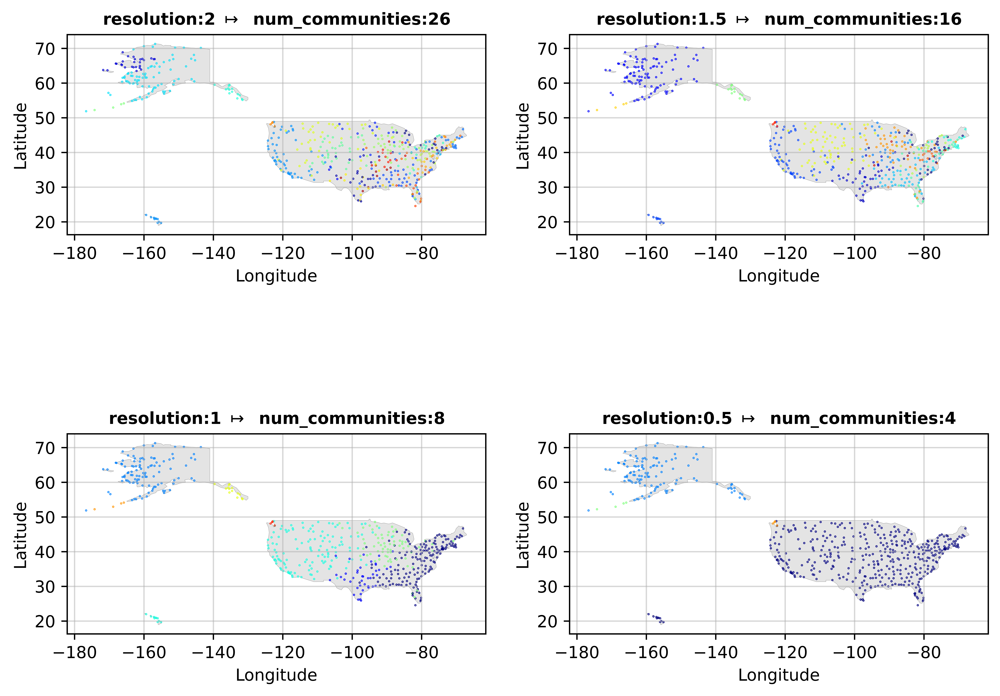

In [16]:
fig, axs = plt.subplots(2,2,figsize=(10,8),dpi=1000)
for n in range(len(resolution_list)):
    ax_i, ax_j = n//2, n%2
    num_communities = int(dn[f'community_{n}'].max())+1
    norm = mpl.colors.Normalize(vmin=0, vmax=num_communities)
    m = cm.ScalarMappable(norm=norm, cmap=cm.jet)
    airports_communities['color'] = [m.to_rgba(i) for i in airports_communities[f'community_{n}'].values]
    countries = gpd.read_file(gpd.datasets.get_path("naturalearth_lowres"))
    mplg = countries.loc[countries["name"] == "United States of America",'geometry']
    mplg.plot(color="lightgrey",ax=axs[ax_i,ax_j], ec="k",lw=0.1, alpha=0.60)
    airports_communities.plot(x="Longitude",y="Latitude",s=0.1,color=airports_communities['color'].values, kind="scatter", ax=axs[ax_i,ax_j])
    axs[ax_i,ax_j].grid(alpha=0.5)
    axs[ax_i,ax_j].set_title(f'resolution:{resolution_list[n]} $\mapsto$  num_communities:{num_communities}',fontweight="bold",size=10)
plt.show()